# Proyecto 1: Modelado de Tópicos

**Datos Masivos II - 0703** 

**Integrantes**:

- Martínez Ostoa, Néstor I.
- Ramírez Bondi, Jorge A.
- Veleros Vega, Luis

**Objetivo**:

- Identificar tópicos a partir de un conjunto de documentos obtenidos de noticias clasificadas como potencialmente falsas y reales.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install contractions

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import seaborn as sns
import re
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
import contractions
import string

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


## Exploración y limpieza de datos

### Diccionario de Datos

- id: unique id for a news article
- title: the title of a news article
- author: author of the news article
- text: the text of the article; could be incomplete
- label: a label that marks the article as potentially unreliable
  - 1: unreliable
  - 0: reliable

In [ ]:
raw_url = "https://raw.githubusercontent.com/nestorivanmo/iimas-data-science/master/fall-21/massive-data-ii/projects/1-fake-news/train.csv"
df = pd.read_csv(raw_url)
df.head()

,id,title,author,text,label
0,0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,House Dem Aide: We Didn’t Even See Comey’s Let...,1
1,1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,0
2,2,Why the Truth Might Get You Fired,Consortiumnews.com,"Why the Truth Might Get You Fired October 29, ...",1
3,3,15 Civilians Killed In Single US Airstrike Hav...,Jessica Purkiss,Videos 15 Civilians Killed In Single US Airstr...,1
4,4,Iranian woman jailed for fictional unpublished...,Howard Portnoy,Print \nAn Iranian woman has been sentenced to...,1


### Limpieza 

In [ ]:
def basic_info(df):
    print('-------------BASIC DATAFRAME INFO-------------')
    print(f'Dataframe dimensions: {df.shape[0]} x {df.shape[1]}\n')
    print(f'Dataframe columns: {np.array(df.columns)}\n')
    print(f'Distribution of missing values ({df.isna().sum().sum()}):\n-------------\n{df.isna().sum()}\n')
    print(f'Dataframe info:\n-------------')
    df.info()

In [ ]:
basic_info(df)

-------------BASIC DATAFRAME INFO-------------
Dataframe dimensions: 20800 x 5

Dataframe columns: ['id' 'title' 'author' 'text' 'label']

Distribution of missing values (2554):
-------------
id           0
title      558
author    1957
text        39
label        0
dtype: int64

Dataframe info:
-------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20800 entries, 0 to 20799
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      20800 non-null  int64 
 1   title   20242 non-null  object
 2   author  18843 non-null  object
 3   text    20761 non-null  object
 4   label   20800 non-null  int64 
dtypes: int64(2), object(3)
memory usage: 812.6+ KB


Dada la informacion anterior y rescantando los "textos" vacios procedemos a quitarlos:

In [ ]:
df_news = df[~df['text'].isna()][['text','label']]
df_news.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20761 entries, 0 to 20799
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   text    20761 non-null  object
 1   label   20761 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 486.6+ KB


Ahora, eliminamos los duplicados:

In [ ]:
df_news.drop_duplicates(subset=['text'],keep='first',inplace=True)
df_news.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20386 entries, 0 to 20799
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   text    20386 non-null  object
 1   label   20386 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 477.8+ KB


In [ ]:
# Revisamos la longitud de las noticias , las mas cortas no las tomaremos en 
# cuenta, pondremos un numero mínimo de texto para poder analizarlo después.
length = []
[length.append(len(str(text))) for text in df_news['text']]
df_news['length'] = length
print('Minimum Length: ', min(df_news['length']), '\nMaximum Length: ',
      max(df_news['length']), '\nAverage Length: ', 
      round(sum(df_news['length'])/len(df_news['length'])))

Minimum Length:  1 
Maximum Length:  142961 
Average Length:  4587


In [ ]:
# Removiendo outliers
df_news = df_news.drop(df_news['text'][df_news['length'] < 50].index, axis = 0)
print(f'Final length: {df_news.shape[0]} news')
print('Minimum Length: ', min(df_news['length']), '\nMaximum Length: ', 
      max(df_news['length']), '\nAverage Length: ', 
      round(sum(df_news['length']) / len(df_news['length'])))
df_news.head()

Final length: 20263 news
Minimum Length:  50 
Maximum Length:  142961 
Average Length:  4615


,text,label,length
0,House Dem Aide: We Didn’t Even See Comey’s Let...,1,4930
1,Ever get the feeling your life circles the rou...,0,4160
2,"Why the Truth Might Get You Fired October 29, ...",1,7692
3,Videos 15 Civilians Killed In Single US Airstr...,1,3237
4,Print \nAn Iranian woman has been sentenced to...,1,938


## Preprocesamiento

1. Quitamos signos especiales
2. Quitamos stop words

In [ ]:
sample_df = df_news.sample(frac=3*.0001)

In [ ]:
def preprocess(df, col):
  # Minúsculas
  df[col] = df[col].apply(lambda x: x.lower()) 

  # Expansión de contracciones
  df[col] = df[col].apply(lambda x: contractions.fix(x)) 

  # Quitamos símbolos especiales
  df[col] = df[col].str.replace("[^a-zA-Z#]", ' ')

  # Espacios en blanco
  df[col] = df[col].apply(lambda x: " ".join(x.split())) 
  df[col] = df[col].str.strip()

  # Palabras cortas
  df[col] = df[col].apply(lambda x: ' '.join(w for w in x.split() if len(w) > 3))

  return df

def remove_stopwords(df, col):
  english_sw = stopwords.words('english')
  cleaned_docs = []
  for idx, row in df.iterrows():
    cleaned_words = [s for s in row[col].split(' ') if s not in english_sw]
    cleaned_docs.append(' '.join(cleaned_words))
  df[col] = cleaned_docs
  return df

In [ ]:
df_news = preprocess(df_news, 'text')
df_news = remove_stopwords(df_news, 'text')
df_news.head()

,text,label,length
0,house aide even comey letter jason chaffetz tw...,1,4930
1,ever feeling life circles roundabout rather he...,0,4160
2,truth might fired october tension intelligence...,1,7692
3,videos civilians killed single airstrike ident...,1,3237
4,print iranian woman sentenced years prison ira...,1,938


### Visualización exploratoria de datos

#### Conjunto completo de palabras

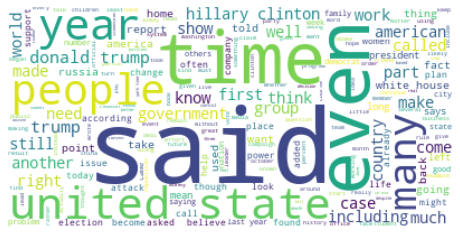

In [ ]:
text = " ".join([x for x in df_news.text])

wordcloud = WordCloud(background_color='white').generate(text)

plt.figure(figsize=(8,6))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

#### Palabras etiquetadas como *fake*

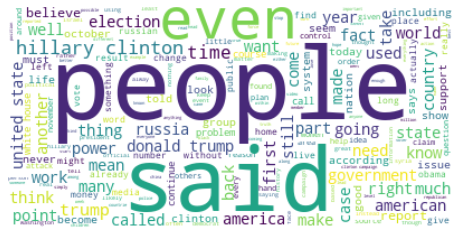

In [ ]:
text = " ".join([x for x in df_news.text[df_news.label==1]])

wordcloud = WordCloud(background_color='white').generate(text)

plt.figure(figsize=(8,6))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

#### Palabras clasificadas como reales

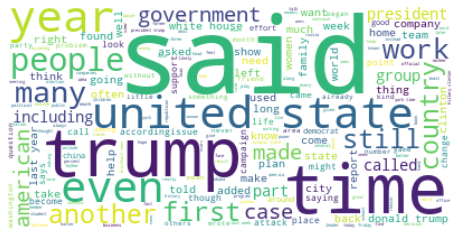

In [ ]:
text = " ".join([x for x in df_news.text[df_news.label==0]])

wordcloud = WordCloud(background_color='white').generate(text)

plt.figure(figsize=(8,6))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

In [ ]:
pd.DataFrame([['Veraces', df_news["label"].value_counts()[0],
               df_news["label"].value_counts()[0] / 
               df_news["label"].value_counts().sum()], 
              ['Bulos', df_news["label"].value_counts()[1], 
              df_news["label"].value_counts()[1] / 
               df_news["label"].value_counts().sum()]], 
             columns=['Clasificación', 
                      'Número documentos', 
                      'Porcentaje']).set_index(['Clasificación'])

,Número documentos,Porcentaje
Clasificación,,
Veraces,10385,0.51251
Bulos,9878,0.48749


#### Clasificación y frecuencia de palabra

In [ ]:
df_news[df_news.label==0].text

1        ever feeling life circles roundabout rather he...
5        trying times jackie mason voice reason week ex...
7        paris france chose idealistic traditional cand...
8        donald trump scheduled make highly anticipated...
9        week michael flynn resigned national security ...
                               ...                        
20792    suicide bombers attacked station jakarta wedne...
20794    donald trump took twitter friday praise vladim...
20795    rapper unloaded black celebrities donald trump...
20796    green packers lost washington redskins week dr...
20797    macy today grew union several great names amer...
Name: text, Length: 10385, dtype: object

In [ ]:
from collections import Counter

word_count = Counter()
df_news[df_news.label==0].text.str.split().apply(word_count.update)
print(word_count)

Counter({'said': 68179, 'trump': 36102, 'would': 25249, 'people': 19942, 'president': 16827, 'like': 16022, 'also': 15527, 'could': 12587, 'time': 11879, 'state': 11485, 'years': 11401, 'many': 11263, 'states': 11058, 'first': 10994, 'last': 10870, 'united': 10194, 'year': 10185, 'even': 10084, 'news': 9430, 'american': 9094, 'government': 8655, 'house': 8343, 'clinton': 8146, 'made': 7726, 'obama': 7553, 'country': 7416, 'going': 7398, 'white': 7182, 'back': 7111, 'campaign': 7063, 'make': 7017, 'percent': 6836, 'told': 6834, 'much': 6761, 'world': 6758, 'think': 6713, 'officials': 6598, 'still': 6561, 'york': 6558, 'city': 6515, 'national': 6478, 'police': 6469, 'times': 6252, 'work': 6182, 'former': 6164, 'including': 6162, 'according': 5989, 'since': 5987, 'political': 5953, 'know': 5886, 'want': 5861, 'public': 5850, 'twitter': 5794, 'another': 5627, 'administration': 5618, 'called': 5613, 'company': 5613, 'party': 5525, 'women': 5525, 'week': 5479, 'million': 5459, 'take': 5409, 

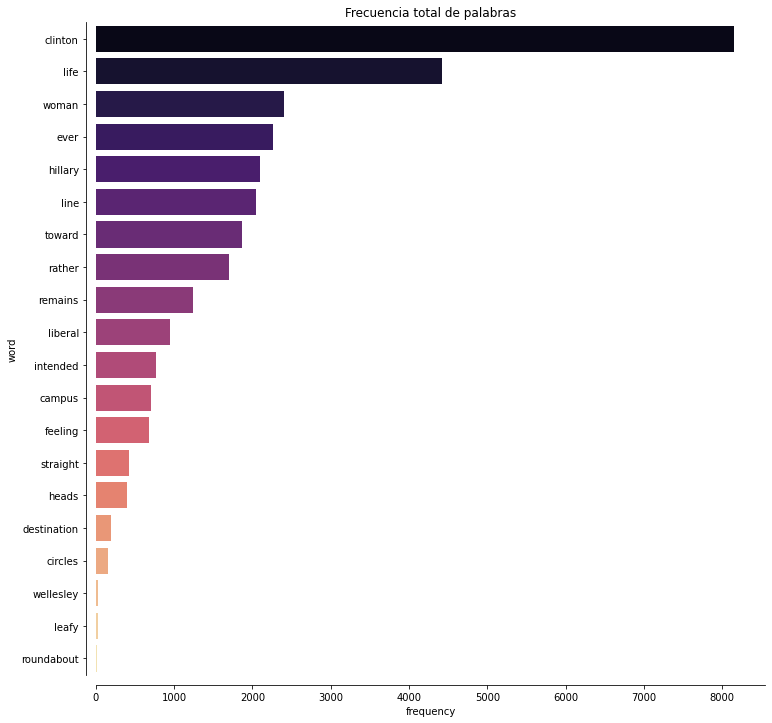

In [ ]:
fig, ax = plt.subplots(figsize=(12, 12))
x_words = list(word_count.keys())[:20]
y_words = list(word_count.values())[:20]
word_df = pd.DataFrame(list(zip(x_words, y_words)), 
                       columns=['word', 'frequency'])
sns.barplot(ax=ax, x='frequency', y='word', data=word_df, 
            order=word_df.sort_values('frequency', ascending=False).word,
            palette='magma')
sns.despine(offset=10)
plt.title('Frecuencia total de palabras')
plt.show()

In [ ]:
word_df

,word,frequency
0,ever,2268
1,feeling,682
2,life,4426
3,circles,154
4,roundabout,14
5,rather,1707
6,heads,398
7,straight,426
8,line,2048
9,toward,1863


## TFIDF + SVD

In [ ]:
num_topics = 20
num_words = 1000
num_words_print = 20

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(
    stop_words='english',max_df = 0.5, smooth_idf=True
)

X = vectorizer.fit_transform(df_news['text'])
print(f'X: {X.shape}')

X: (20263, 142765)


In [ ]:
from sklearn.decomposition import TruncatedSVD
svd_model = TruncatedSVD(
    n_components=num_topics, algorithm='randomized', n_iter=100, random_state=122
)
svd_model.fit(X)

TruncatedSVD(algorithm='randomized', n_components=20, n_iter=100,
             random_state=122, tol=0.0)

In [ ]:
topics = []
terms = vectorizer.get_feature_names()
for i, comp in enumerate(svd_model.components_):
    terms_comp = zip(terms, comp)
    sorted_terms = sorted(terms_comp, key= lambda x:x[1], reverse=True)[:num_words]
    print(f'\nTopic #{i+1}:\n-----------')
    j = 0
    topics.append(sorted_terms)
    for t in sorted_terms:
        print(t[0], end=' ')
        j += 1
        if j >= num_words_print:
          break
    print()


Topic #1:
-----------
trump clinton president hillary obama election campaign state states donald russia like american news house government white united media republican 

Topic #2:
-----------
clinton trump hillary comey emails campaign election investigation donald email voters republican weiner presidential podesta server democratic wikileaks abedin candidate 

Topic #3:
-----------
clinton hillary emails comey investigation email weiner podesta wikileaks abedin foundation server information department state huma police syria russia classified 

Topic #4:
-----------
russia syria russian syrian putin military trump aleppo nato assad nuclear forces united isis foreign iran turkey obama moscow president 

Topic #5:
-----------
comey police investigation department breitbart president court officials justice officers house emails federal attorney director trump administration security enforcement news 

Topic #6:
-----------
obamacare health obama insurance republicans house care per

El `DataFrame` que acabamos de generar nos proporcionará información con la siguiente forma:

In [ ]:
sorted_terms_df = pd.DataFrame(sorted_terms, columns=['word', 'frequency'])
sorted_terms_df.set_index(['word'], inplace=True)
print(sorted_terms_df.info())
sorted_terms_df['frequency']

<class 'pandas.core.frame.DataFrame'>
Index: 1000 entries, immigration to accepted
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   frequency  1000 non-null   float64
dtypes: float64(1)
memory usage: 15.6+ KB
None


word
immigration    0.193595
border         0.187742
breitbart      0.168479
comey          0.168267
north          0.131114
                 ...   
moved          0.004349
include        0.004343
helps          0.004342
lithuania      0.004339
accepted       0.004336
Name: frequency, Length: 1000, dtype: float64

## Visualización

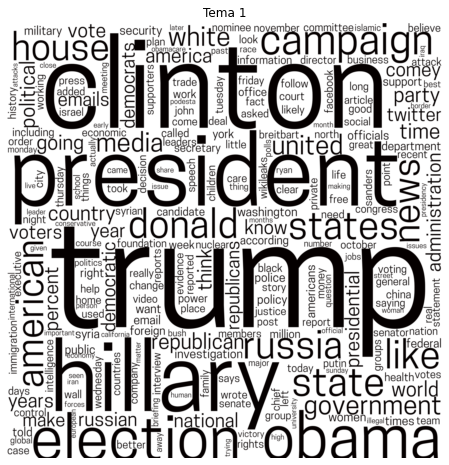

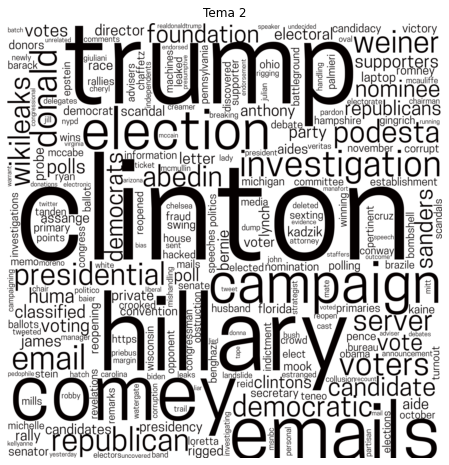

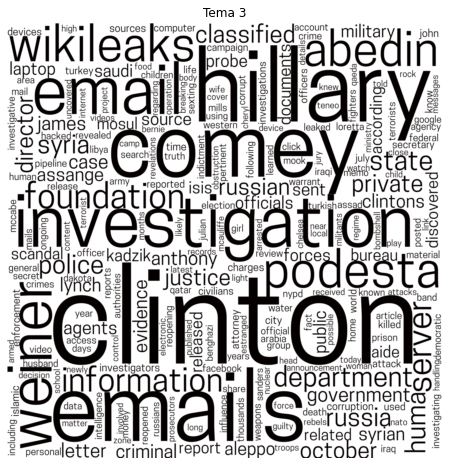

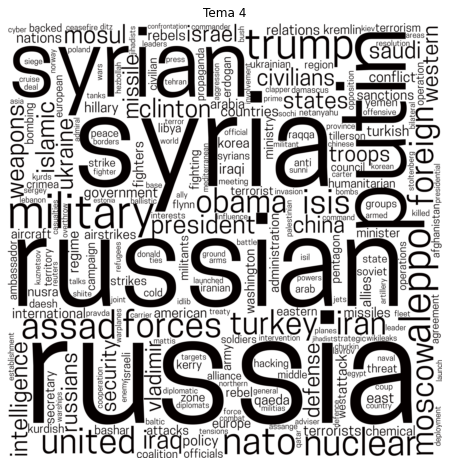

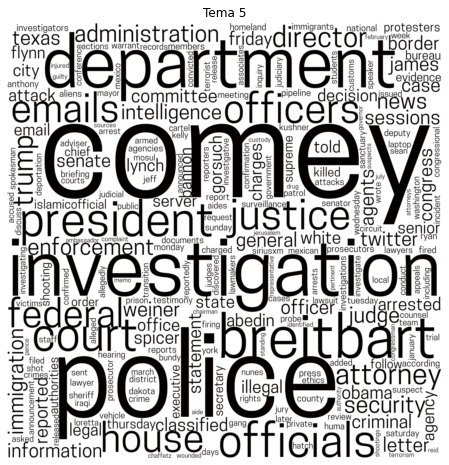

...

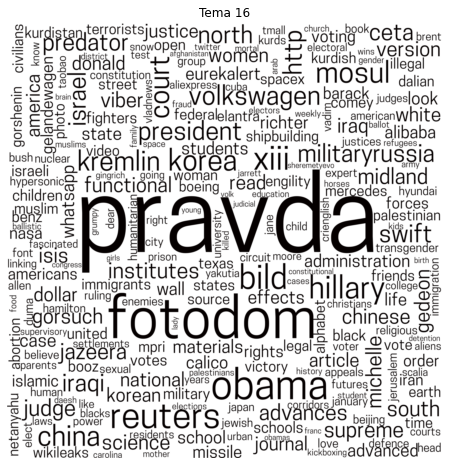

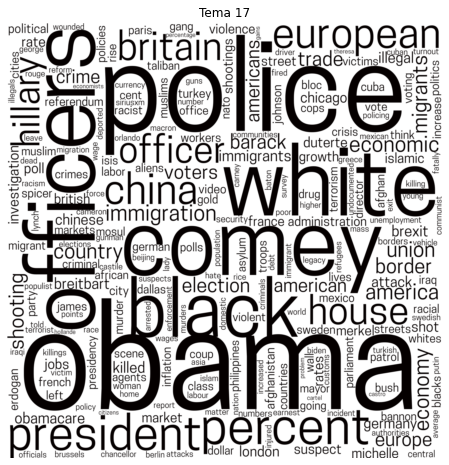

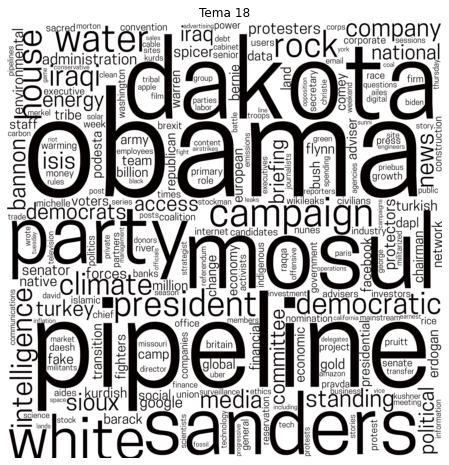

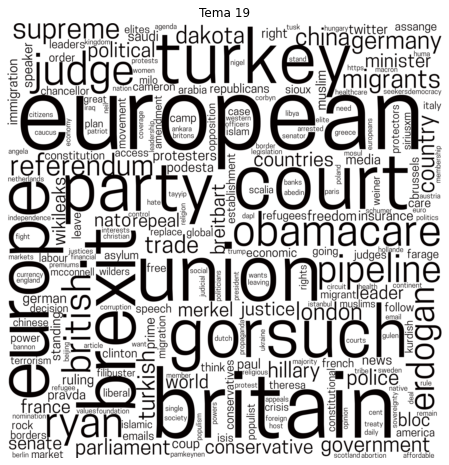

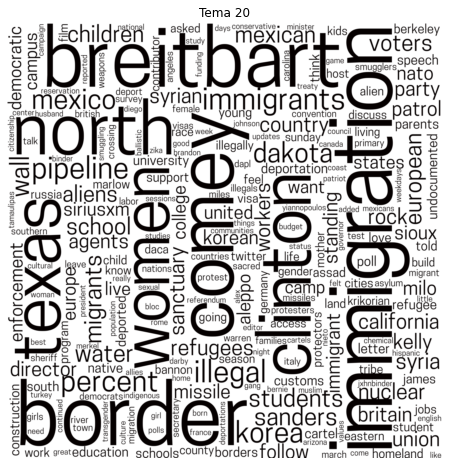

In [ ]:
font_path = '/content/drive/MyDrive/Colab Data/CooperHewitt-Book.otf'
background_color = 'white'
width = 2500
height = 2500
max_words = 250
wordcloud_figsize = (12, 8)


def generate_wordcloud(text_data, i):
  wordcloud = WordCloud(font_path=font_path, background_color=background_color,
                        width=width, height=height, 
                        max_words=max_words).generate_from_frequencies(text_data)
  wordcloud.recolor(color_func=get_black_color)
  plt.figure(figsize=wordcloud_figsize)
  plt.axis('off')
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.title(f'Tema {i}')
  plt.show()
  return wordcloud


def get_black_color(word, font_size, position, orientation, random_state=None, 
                    **kwargs):
  return "hsl(0, 100%, 1%)"

i = 1
for topic in topics:
  topic_df = pd.DataFrame(topic, columns=['word', 'frequency'])
  topic_df.set_index(['word'], inplace=True)
  generate_wordcloud(topic_df['frequency'], i)
  i += 1

Probamos con otra fuente para ver el efecto sobre la visualización.

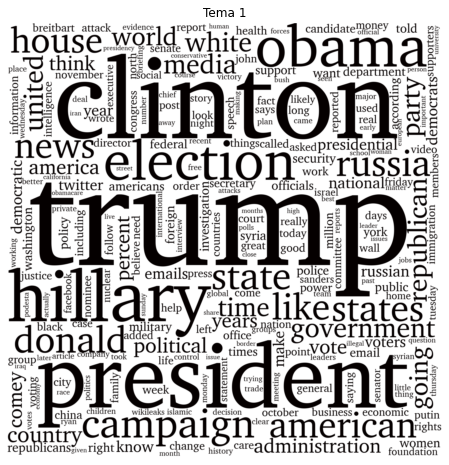

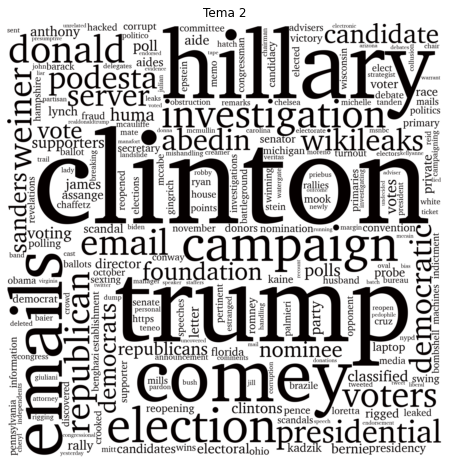

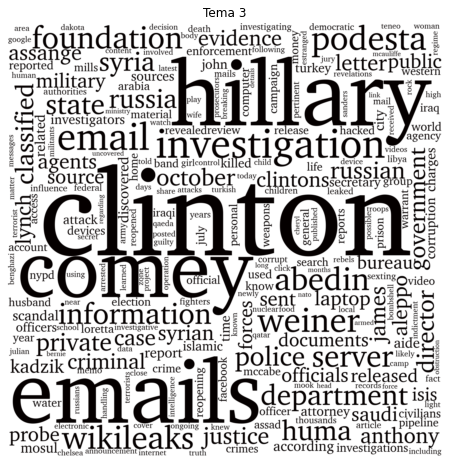

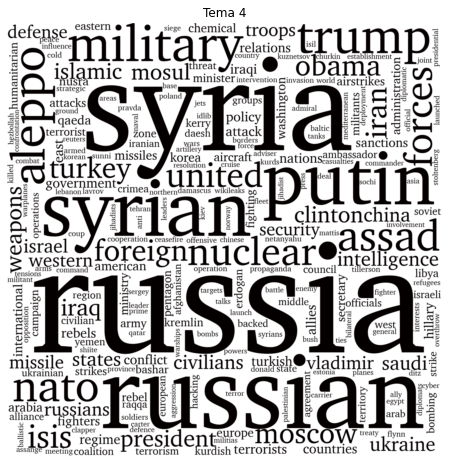

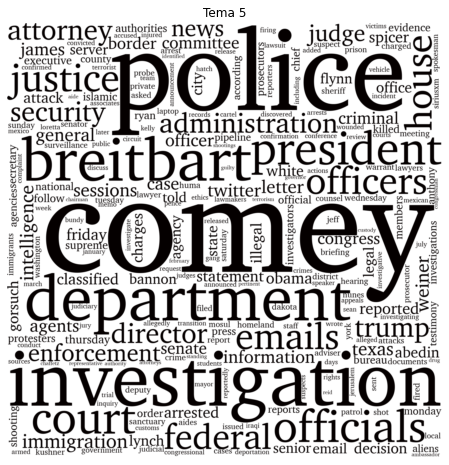

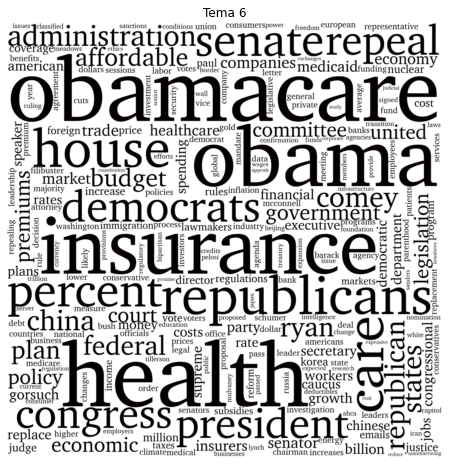

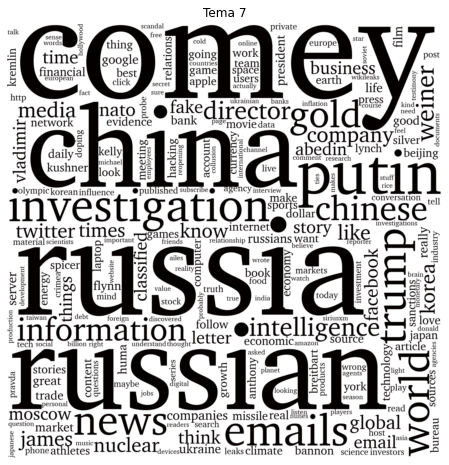

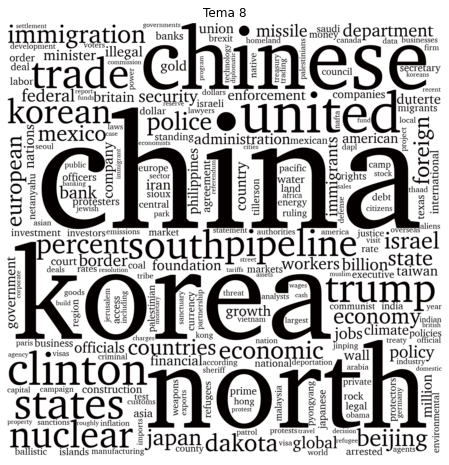

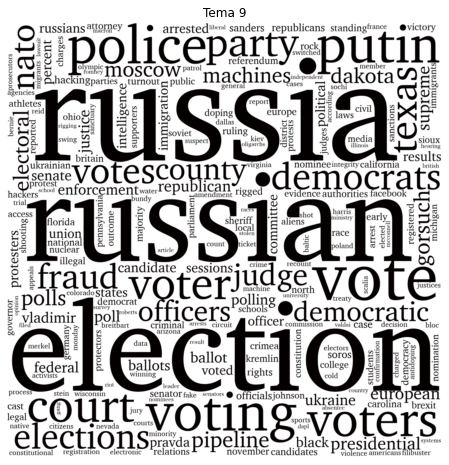

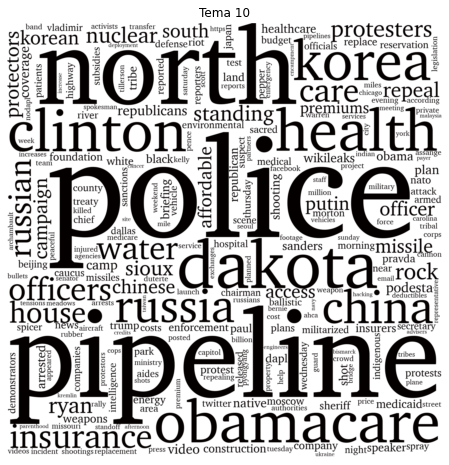

In [ ]:
font_path = '/content/drive/MyDrive/Colab Data/Charter.ttc'

i = 1
for topic in topics:
  topic_df = pd.DataFrame(topic, columns=['word', 'frequency'])
  topic_df.set_index(['word'], inplace=True)
  generate_wordcloud(topic_df['frequency'], i)
  i += 1
  if i > 10:
    break